# MACHINE LEARNING
#### MATH 2319: COURSE PROJECT 
#### Group: 132
#### Name: Bhargav Rele
#### Student Number: s3761977

# Introduction

With the advent of technology and reduction in barriers to entry, it is incontestable that the banking industry has faced a stark increase in competition in recent years. The Australian Banking Association (2017), claim that one in six adults switched banks in 2016 (3 million customers). Zuchetti (2017) in his article, claims that this may be in part due to the ease associated with switching to a competitive bank. When a customer switches from one bank by closing their account, and engaging with the services of another bank, we say the customer has churned. By predicting the likelihood of a customer (in its current customer base) churning beforehand, the bank may be able to focus its marketing efforts on potential churners prior to them churning. This may enable the bank to retain its customer base. 

The primary purpose of the analysis is to construct a machine learning classification model that can predict whether or not a customer of a bank is likely to churn. In order to do so, banking data (acquired from on online source) consisting of 10 descriptive features (quantitative and qualitative) and 1 binary target feature, is modelled using the K-Nearest Neighbour Classifier, the Decision Tree Classifier and the Random Forest Classifier. Parameter specifications and feature selection for each of the aforementioned classifiers are determined using grid searches over all possible parameter values. The final model was selected based on its capabilities of optimising either the F-1 Score metric or the ROC-AUC metric, given that the sample data has a class imbalance within the target feature. The optimal models that we are able to derive are the Decision Tree Classifier and the Random Forest Classifier, given that they are 82.9% and 82.6% accurate (respectively) in predicting churners and non churners within a given bank;s customer base, given various descriptive features. 

# Data Source

The original dataset is sourced from Kaggle (https://www.kaggle.com/shrutimechlearn/churn-modelling) and consists of the following features:

* Surname : Surname of the customer
* CreditScore : Credit score of the customer
* Geography : The country of origin of customer ('Germany', 'France' or 'Spain')
* Gender : Gender of the customer ('Female' or 'Male')
* Age : Age of the customer
* Tenure : Years spent as customer of the bank
* Balance : Customer's account balance
* NumOfProducts : Number of bank products that the customer uses
* HasCrCard : Does the customer have a credit card? ('0'=No, '1'=Yes)
* IsActiveMember : Does the customer actively engage with the bank ('0'=No, '1'=Yes)
* EstimatedSalary : Estimated salary of the customer.
* Exited : Is the customer a churner or non-churner? ('0'=No, '1'=Yes)

The quantitative descriptive features of our dataset are:
1) CreditScore
2) Age
3) Tenure
4) Balance
5) NumOfProducts
6) EstimatedSalary

The qualitative descriptive features of our dataset are:
1) Surname
2) Geography
3) Gender
4) HasCrCard
5) IsActiveMember

The target feature of our dataset is the 'Exited' feature that consists of binary classes. 

# Packages and Data Importation

We begin the analysis by importing the relevant packages and the dataset. The original dataset (data) consists of 10,000 rows that represent individual customers and, 14 columns that represent the various attributes of any given customer. For the purpose of this analysis however, 'df' (dataset we are analysing) is created by randomly sampling only 5000 customers. This is done to ensure processing power limitations do not hinder the analysis.

Furthemore, the original dataset (data) consists of 7963 non-churners and 2037 churners. When we randomly sample to create the dataset at the crux of our analysis (df), we choose to approximately maintain these proportions. This is primarily done in order to replicate reality. That is, we can expect the number of churners to be far less than the number of non-churners in a given bank's customer base. As a result, the dataset (df) consists of 3997 non-churners and 1003 churners.

In [34]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore') #ignore warning messages

import matplotlib.pyplot as plt 
import altair as alt
import seaborn as sns

In [35]:
data = pd.read_csv("Churn_Modelling.csv") #import original dataset from same working directory

In [36]:
data.shape 

(10000, 14)

In [37]:
data['Exited'].value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

Note: a stratified sampling technique is deemed unnecessary while subsetting the data, as the random sampling technique manages to maintain the original dataset's (data) target feature proportions.

In [38]:
df = data.sample(5000,random_state=999) #sample 5000 observations at random

In [39]:
df.shape # df has 5000 rows and 14 columns as expected

(5000, 14)

In [40]:
df['Exited'].value_counts()

0    3997
1    1003
Name: Exited, dtype: int64

In [41]:
df.dtypes # HasCrCard, IsActiveMember and Exited is supposed to be object dtype instead of int64

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

The sampled dataset; df, has 5000 rows and 14 columns as expected. However, the data types of the features are not appropriate. In particular, HasCrCard, IsActiveMember and Exited need to have their data type switched from int64 to object.

In [42]:
int64_columns = ['CreditScore','Age','Tenure','NumOfProducts']
float64_columns = ['Balance','EstimatedSalary']
object_columns = ['Geography','Gender','HasCrCard','IsActiveMember','Exited']
numeric_columns =int64_columns+float64_columns

for col in df.columns.values:
    if col in numeric_columns:
        df[col] = df[col].astype(np.number)
    else:
        df[col] = df[col].astype(object)

In [43]:
df.dtypes

RowNumber           object
CustomerId          object
Surname             object
CreditScore        float64
Geography           object
Gender              object
Age                float64
Tenure             float64
Balance            float64
NumOfProducts      float64
HasCrCard           object
IsActiveMember      object
EstimatedSalary    float64
Exited              object
dtype: object

In [44]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9031,9032,15742323,Barese,541.0,France,Male,39.0,7.0,0.00,2.0,1,0,19823.02,0
3462,3463,15713596,Ugochukwu,428.0,France,Female,62.0,1.0,107735.93,1.0,0,1,58381.77,0
3863,3864,15645095,Huang,674.0,France,Female,28.0,3.0,0.00,1.0,1,0,51536.99,0
1144,1145,15694821,Hardy,765.0,Germany,Male,43.0,4.0,148962.76,1.0,0,1,173878.87,1
2692,2693,15736274,Prokhorova,751.0,France,Male,31.0,8.0,0.00,2.0,0,0,17550.49,0


Now that our data frame's features have been given the appropriate data type specifications, we can proceed with the data preparation steps.

# Data Preparation

## ID-Like Columns

'RowNumber' and 'CustomerId' are expected to consist of unique values (representing unique customers), that do not hold information that influences the target feature ('Exited'). A boolean comparison of the number of unique values and the length of a each aforementioned column confirms that they are in fact ID-like. Hence, these columns are deleted from the dataset.

In [45]:
df['RowNumber'].nunique() == len(df['RowNumber'])

True

In [46]:
df['CustomerId'].nunique() == len(df['CustomerId'])

True

In [47]:
df.drop(["RowNumber","CustomerId"],inplace=True, axis=1) #delete constant features

In [48]:
df.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9031,Barese,541.0,France,Male,39.0,7.0,0.00,2.0,1,0,19823.02,0
3462,Ugochukwu,428.0,France,Female,62.0,1.0,107735.93,1.0,0,1,58381.77,0
3863,Huang,674.0,France,Female,28.0,3.0,0.00,1.0,1,0,51536.99,0
1144,Hardy,765.0,Germany,Male,43.0,4.0,148962.76,1.0,0,1,173878.87,1
2692,Prokhorova,751.0,France,Male,31.0,8.0,0.00,2.0,0,0,17550.49,0


## Constant Features

Constant features contirbute to the curse of dimensionality and take up a portion of the explanatory power within our models, without contributing to their predictive capabilities. If the dataset consists of constant features, deleting such features will reduce the dimensionality of the dataset while potentially increasing the models' scoring metrics. Hence, if any constant features exist in our dataset (df), they are to be removed.

In [49]:
df = df.loc[:,df.nunique()!=1]

In [50]:
df.shape

(5000, 12)

Given that the shape of the dataset(df) hasn't changed since the previous step, our dataset did not consist of any constant features. 

## Other Irrelevant Features

A feature can be classified as irrelevant if it does not contribute to the learning process within a machine learning model. In dataset (df), the 'Surname' feature does not have any statistical relevance and is assumed to exist purely to fulfill record-keeping purposes. Hence, it is appropriate for us to delete the 'Surname' feature from the dataset (df).

In [51]:
df.drop(["Surname"],inplace=True, axis=1)

In [52]:
df.shape

(5000, 11)

The dataset (df) now consists of 5000 rows and 11 features.

## Redundant Features

A feature is considered to be redundant if it represents the same information as another feature within the same dataset. A visual inspection leads us to confirm that the dataset (df) does not consist of redundant features.

## Data Entry Errors

In order to ensure there are no data entry errors, we evaluate the unique components and their respective counts, for each categorical column. The names of these respective columns have been saved in the list named 'object_columns' (assigned earlier). 

In [53]:
for col in object_columns:
    print(df[col].value_counts(dropna=False))

France     2512
Spain      1258
Germany    1230
Name: Geography, dtype: int64
Male      2722
Female    2278
Name: Gender, dtype: int64
1    3532
0    1468
Name: HasCrCard, dtype: int64
1    2610
0    2390
Name: IsActiveMember, dtype: int64
0    3997
1    1003
Name: Exited, dtype: int64


The results indicate that the dataset does not consist of any data entry errors. The number of unique values and the unique values themselves match our expectations, for each categorical column of our dataset. Hence, no corrections are to be made. 

The descriptive statistics of the numerical columns are then evaluated to ensure each numerical column's values are within a sensible range.

In [54]:
df.describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,649.582600,39.017800,5.040400,75711.714988,1.514800,99125.073958
std,96.737503,10.585192,2.882018,62561.019480,0.570128,57965.792180
min,350.000000,18.000000,0.000000,0.000000,1.000000,96.270000
25%,584.000000,32.000000,3.000000,0.000000,1.000000,49259.392500
50%,651.000000,37.000000,5.000000,96824.620000,1.000000,99193.865000
75%,716.000000,44.000000,8.000000,127791.437500,2.000000,148955.820000
max,850.000000,92.000000,10.000000,221532.800000,4.000000,199953.330000


The results indicate that the minimum and maximum bounds for each numerical column is within a sensible range. Hence, no corrections are necessary.

## Missing Values

We can then proceed with examining the dataset for missing values. 

In [55]:
df.isna().sum() 

CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [56]:
df.isnull().sum()

CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

Given that there aren't any missing values in the dataset (df), the necessary imputation steps are not taken.

## Outliers

We can then proceed with examining the outliers present in the numerical features of the dataset (df). However, this is done to solely gain an understanding of the dataset (df). That is, no corrections shall be made to impute these outliers in any way or form as we intend on using a RobustScaler() for our dataset tansformation later on.

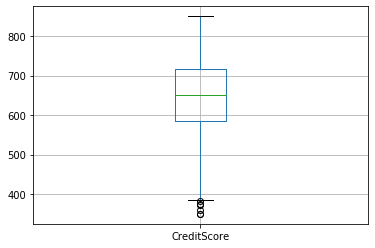

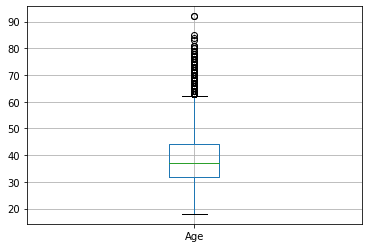

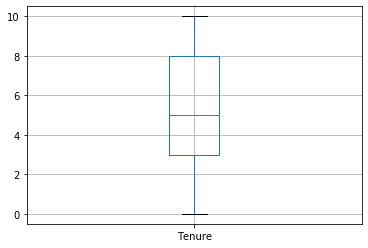

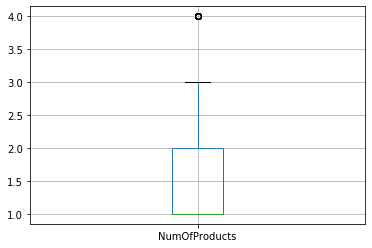

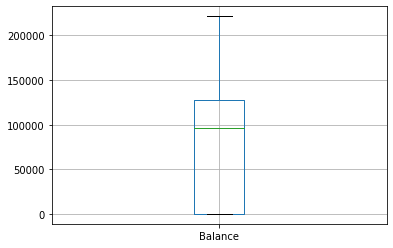

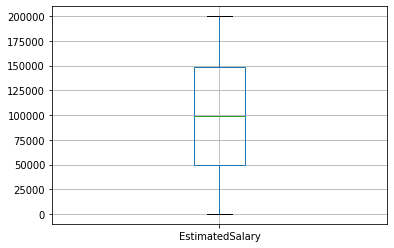

In [57]:
for col in numeric_columns:
    df.boxplot(column=col)
    plt.show()

Hence, the features; CreditScore, Age, Tenure and NumOfProducts seem to have several outliers. Furthermore, the distirbution for Balance consists of several $0 balances. This may cause the distribution to skew severly.

## Discretization of Numeric Features

It is advisable for us to discretize 'Age' into the categories; 'young', 'middle-aged' and 'old'. Specific age values are likely to experience very small fluctuations. Such small fluctuations contribute to noise in our models. Keeping other features constant, a small difference in age (say 1 year) between two individuals, conceptually should not make one individual more likely to exit the banks services than the other. On the other hand, this may not be true for a large difference in age (such as 5 or 10 years) between two individuals. Furthermore, if we intend on using a Decision Tree (DT) Classifier, the inclusion of an age categorical column as opposed to an age numerical column increases the algorithm's ability to split the dataset into homegenous nodes thus, improving the scoring metric of our model (Albarji, 2017). Hence, we discretize 'Age' into the three aforementioned categories, by using quantile-based discretization.

In [58]:
df_disc = df.copy()

df_disc['Age'] = pd.qcut(df_disc['Age'],q=3, labels=['young','middle-aged','old'])

df_disc['Age'] = df_disc['Age'].astype(object) #change dtype og Age from 'category' to 'object'

df_disc['Age'].value_counts()

young          1820
old            1635
middle-aged    1545
Name: Age, dtype: int64

Hence, 'Age' has successfully been discretized into the categories; young, old and middle-aged. The new dataset (df_disc) is presented below.

In [59]:
df_disc.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9031,541.0,France,Male,middle-aged,7.0,0.00,2.0,1,0,19823.02,0
3462,428.0,France,Female,old,1.0,107735.93,1.0,0,1,58381.77,0
3863,674.0,France,Female,young,3.0,0.00,1.0,1,0,51536.99,0
1144,765.0,Germany,Male,old,4.0,148962.76,1.0,0,1,173878.87,1
2692,751.0,France,Male,young,8.0,0.00,2.0,0,0,17550.49,0


## Encoding Categorical Features

The dataset (df_disc) now consists of 5000 rows and 11 columns. We can then proceed to seperate the descriptive features from the target feature by simply creating two new data frames; 'df_disc_descrip' and 'df_disc_target'. Features 1 to 10 represent all the descriptive features, while feature 11 itself is the target feature. 

In [60]:
df_disc_descrip = df_disc.drop(columns='Exited')
print('The shape of df_disc_descrip is :', df_disc_descrip.shape)

df_disc_target = df_disc['Exited']
print('The shape of df_disc_target is :', df_disc_target.shape)

The shape of df_disc_descrip is : (5000, 10)
The shape of df_disc_target is : (5000,)


Let us then proceed with encoding the various categorical features. Given that the dataset (df_descrip) does not consist of any ordinal features, integer encoding is unnecessary. However, the nominal features of the dataset need to be one-hot encoded. Before doing so, we create a new dataset called 'df_disc_descrip_onehot' and carry out the encoding task on it.

In [61]:
df_disc_descrip_onehot =df_disc_descrip.copy()

object_columns.pop()  #get rid of the target column name from the end of the list 
object_columns.append('Age') #add age column name to the end of the list

for col in object_columns:
    n=len(df_disc_descrip_onehot[col].unique())
    if n==2:
        df_disc_descrip_onehot[col] = pd.get_dummies(df_disc_descrip_onehot[col],drop_first=True)

df_disc_descrip_onehot = pd.get_dummies(df_disc_descrip_onehot)

As is observale from the output below, the 'Geography' feature and the 'Age' feature have been split into 3 different binary columns. The dataset (df_disc_descrip) consists of 5000 rows and 14 descriptive features.

In [62]:
df_disc_descrip_onehot.head()

,CreditScore,Gender,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Age_middle-aged,Age_old,Age_young
9031,541.0,1,7.0,0.00,2.0,1,0,19823.02,1,0,0,1,0,0
3462,428.0,0,1.0,107735.93,1.0,0,1,58381.77,1,0,0,0,1,0
3863,674.0,0,3.0,0.00,1.0,1,0,51536.99,1,0,0,0,0,1
1144,765.0,1,4.0,148962.76,1.0,0,1,173878.87,0,1,0,0,1,0
2692,751.0,1,8.0,0.00,2.0,0,0,17550.49,1,0,0,0,0,1


In [63]:
df_disc_descrip_onehot.shape

(5000, 14)

## Encoding Target Feature

As per the data source's description, the 'Exited' feature (target feature) is specified as 0 when the customer does not churn and 1 when the customer does churn. In accordance with best practises, we want the churn classification to take up the value of 1. Hence, encoding of the target feature is unnecessary. 

In [64]:
df_disc_target.value_counts()

0    3997
1    1003
Name: Exited, dtype: int64

In [65]:
df_disc_target.head()

9031    0
3462    0
3863    0
1144    1
2692    0
Name: Exited, dtype: object

## Normalization

Due to the existence of outliers, we shall normalize the dataset (df_disc_descrip_onehot) using a the Robust Scaler. This ensures that the median is used instead of mean and, mean absolute deviations is used instead of standard deviations, in the standardization procedure. This ensure, that the distribution of each numeric feature, approximately follows a normal distribution and isn't influenced by white noise. Note: We save the normalised dataset as 'df_disc_descrip_onehot_norm'.

In [66]:
from sklearn import preprocessing
df_disc_descrip_onehot_norm = preprocessing.RobustScaler().fit_transform(df_disc_descrip_onehot)

In [67]:
df_disc_descrip_onehot_norm = pd.DataFrame(df_disc_descrip_onehot_norm, 
                                           columns=df_disc_descrip_onehot.columns.values)

In [68]:
df_disc_descrip_onehot_norm.head()

,CreditScore,Gender,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Age_middle-aged,Age_old,Age_young
0,-0.833333,0.0,0.4,-0.757677,1.0,0.0,-1.0,-0.796125,0.0,0.0,0.0,1.0,0.0,0.0
1,-1.689394,-1.0,-0.8,0.085384,0.0,-1.0,0.0,-0.409364,0.0,0.0,0.0,0.0,1.0,0.0
2,0.174242,-1.0,-0.4,-0.757677,0.0,0.0,-1.0,-0.478020,0.0,0.0,0.0,0.0,0.0,1.0
3,0.863636,0.0,-0.2,0.407994,0.0,-1.0,0.0,0.749124,-1.0,1.0,0.0,0.0,1.0,0.0
4,0.757576,0.0,0.6,-0.757677,1.0,-1.0,-1.0,-0.818920,0.0,0.0,0.0,0.0,0.0,1.0


In [69]:
df_disc_descrip_onehot_norm.shape

(5000, 14)

Hence, our final preprocessed datasets are as follows:

* df_disc_descrip_onehot_norm consists of 5000 rows and 14 descriptive features
* df_disc_target consists of 5000 rows and the target feature, 'Exited'.

For the modelling phase, we combine the two datasets (df_disc_descrip_onehot_norm and df_disc_target) to create a final preprocessed dataset called, 'df_clean'. 

In [70]:
df_clean = pd.DataFrame(df_disc_descrip_onehot_norm, columns=df_disc_descrip_onehot.columns.values)
df_clean['Exited'] = df_disc_target.values

In [71]:
df_clean.shape

(5000, 15)

In [72]:
df_clean.head()

,CreditScore,Gender,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Age_middle-aged,Age_old,Age_young,Exited
0,-0.833333,0.0,0.4,-0.757677,1.0,0.0,-1.0,-0.796125,0.0,0.0,0.0,1.0,0.0,0.0,0
1,-1.689394,-1.0,-0.8,0.085384,0.0,-1.0,0.0,-0.409364,0.0,0.0,0.0,0.0,1.0,0.0,0
2,0.174242,-1.0,-0.4,-0.757677,0.0,0.0,-1.0,-0.478020,0.0,0.0,0.0,0.0,0.0,1.0,0
3,0.863636,0.0,-0.2,0.407994,0.0,-1.0,0.0,0.749124,-1.0,1.0,0.0,0.0,1.0,0.0,1
4,0.757576,0.0,0.6,-0.757677,1.0,-1.0,-1.0,-0.818920,0.0,0.0,0.0,0.0,0.0,1.0,0


Hence, our final preprocessed dataset (df_clean) consists of 14 descriptive features and 1 target feature. 
[Note: While creating the Machine Learning models, we will be using 'df_disc_descrip_onehot' as our descriptive dataset and, 'df_disc_target' as our target dataset.

# Data Exploration and Visualisation

For the purpose of visualising the features, we shall continue using the original dataset (df) as opposed to the preprocessed dataset (df_clean), given that we are primarily concerned with the behaviour of the features as opposed to the values taken up by them. For the purpose of data exploration however, we shall use both; the original dataset (df) and the preprocessed dataset (df_clean). 

## Univariate Plots

#### Estimated Salary

The histogram for the Estimated Salary of the customers, seems to be uniformly distributed. In other words, the frequency of each bin i.e., the number of customers within each estimated salary bracket is approximately the same. This implies that each estimated salary bracket (bins in histogram) is well balanced. Furthermore, the histogram is multi-modal which implies that the frequency of observations within each estimated salary bracket is maximised at several points. 

If we want our classification models to generalise their results over unseen data, it would be ideal to have well-balanced bins for estimated salary. The algorithm will therefore be able to better identify churners across various salary brackets as opposed to being limited by only those salary brackets that consist of a high number of observations. 

In [73]:
alt.Chart(df,width=700,title='Estimated Salary Distribution').mark_bar(opacity=0.7,color='#00C78C').encode(
    alt.X('EstimatedSalary', bin=alt.Bin(maxbins=20)), 
    y=alt.Y('count()',title='Number of Bank Customers'))

alt.Chart(...)

#### Tenure

Tenure refers to the number of years an individual observation has been using the banks services. We assume the feature is quantitative (discrete) and ranges from 0-10 years (althought tenure can exceed 10 years), within our original dataset (df).

The histogram for the tenure of customers, seems to follow a relatively uniform distribution. The number of observations within each Tenure is approximately the same (except when Tenure is 0 years or 10 years). The number of customers within different Tenure levels is well-balanced. This is ideal as the classification algorithm will be able to generalise its predictive abilities across customers regardless of how long they have been using the bank's services.

In [74]:
alt.Chart(df,width=700,title='Customer Tenure').mark_bar(size=30,color='#00C78C',opacity=0.7).encode(
    alt.X('Tenure',
          axis=alt.Axis(values=list(df['Tenure'].value_counts().index))),
    alt.Y('count()',title='Number of Bank Customers')
    )

alt.Chart(...)

#### Age

For the purpose of creating a histogram, the distribution of age is binned into 20 categories. Each category represents 5 years. 

The histogram for the distribution of Age gives us an idea of the number of customers the bank has within each age category. The visualisation indicates that the bank has the highest number of customers aged between 35-40 years. The second and third highest age categories, are 30-35 and 40-45 years, respectively. Hence, the customer base does not have a well-balanced age feature. 

Most customers within the original dataset (df) seem to be Millenials (currently aged between 22-38 years). Jeffry Pilcher (of The Financial Brand) summarises the findings of an analysis conducted by FICO in 2014, on how banks could benefit by targetting Millenials. As mentioned in his newsletter, Pilcher concludes that Millenials are less loyal to their primary banks, in comparison to other generations. Furthermore, Millenials are more likely to be satisfied with banks that provide services on mobile phones than with those who do not. Lastly, Millenials are more likely to switch to competitive banks due to better ATM availability and lower fees on withdrawals from these ATMs.

Hence, it is perhaps ideal for our model to primarily consist of Millenial customers, given that they are most likely to churn in comparison to other generations. The downside to this however, is that the model may lose some of its generalisation capabilities and may yield a high training accuracy due to overfitting. That is, if we were to test the same model on a customer dataset with primarily old-aged customers, the accuracy of our predictions may not be as high as the training accuracy of our model. 

In [75]:
alt.Chart(df,width=700,title='Distribution for Age of Customers').mark_bar(
    size=40,color='#00C78C',opacity=0.7).encode(
    alt.X('Age',bin=alt.Bin(maxbins=20)),
    alt.Y('count()',title='Number of Bank Customers')
    )

alt.Chart(...)

## Bivariate Plots

#### Exited and Tenure

Plotting 'Exited' and 'Tenure' would give us an idea of the proportion of churners that exist for each value of Tenure. The plot below indicates that the proportion of churners is approximately the same, regardless of tenure. 

As mentioned earlier, this is ideal as the classification algorithm will be able to generalise its predictive abilities across customer bases regardless of how long a given customer has been using the bank's services. An interesting implication of the visualisation, is that customers who are most loyal to the bank (tenure above 9 years), seem to be just as likely to churn as customers who are least loyal (tenure below 2 years).

In [76]:
alt.Chart(df,width=700,title='Proportion of Churners, given Tenure').mark_bar(opacity=0.8).encode(
    x=alt.X('count(Tenure)', stack="normalize"),
    y='Tenure:O',
    color='Exited:O'
)

alt.Chart(...)

#### Exited and Age

Plotting 'Exited' and 'Age' would give us an idea of the proportion of churners that exist within a given age bracket. 

According to the visualisation produced below, customers aged between 55-60 years are more likely to churn (from a probabilistic standpoint) in comparison to customers in other age brackets. The second most likely group of churners are customers aged between 50-55 years. Furthermore, customers within our dataset, aged between 50-60 years are more likely to churn that not (from a probabilistic standpoint), given that the proportion of churners within their respective age brackets exceed 50%.

In [77]:
alt.Chart(df,width=700,title='Proportion of Churners, given Age').mark_bar().encode(
    x=alt.X('count()',stack='normalize'),
    y=alt.Y('Age:O',bin=alt.Bin(maxbins=20)),
    color='Exited:O'
)

alt.Chart(...)

## Multivariate Plots

#### Sum of Balances amongst Churners and Non-churners, Split by Gender

We then proceed with visualising the normalised sum of bank balances for all customers, after grouping them by gender. The first and second bar evidently represent the female and male customers, respectively. The green component of any given bar represents the proportion of customers that did not churn while the orange component represents the proportion of customers that did churn. Despite having a slightly higher number of Male customers in comparison to female customers in our dataset (df), female churners contribute to a higher overall loss of balance than male churners do. This is based on the assumption that banks do not have access to the bank balances of customers once they churn and, hence face an overall reduction in balances when customers churns. Therefore, female churners seem to contribute more to these reductions than male churners do, in our dataset (df). 

In [78]:
alt.Chart(df,
          width=500,
          title='Total Balance($) amongst Churners and Non-churners, split by Gender'
         ).mark_bar(opacity=0.8).encode(
    x=alt.X('Gender:O'),
    y=alt.Y('sum(Balance)',stack='normalize'),
    color=alt.Color('Exited:O',scale=alt.Scale(scheme = 'Set2'))
)

alt.Chart(...)

#### Sum of Balances amongst Churners and Non-churners, split by Geography

We can then proceed with plotting the sum of bank balances held by customers in different geographical regions and, observe the impact that churners and non-churners have on such balances.

The primary markets for the banks operations are France, Germany and Spain. Amongst customers who havent churned, the highest total balance held with the bank, seems to be held by French customers, followed by German customers and then Spanish customers. Amongst customers who have churned, the highest total balance is held by German customers, followed by French customers and then Spanish customers. This is implies that the reduction in balances due to churning, is highest in Germany and least in Spain. Hence, when it comes to deriving a strategy to prevent churning, the bank should take the geographical region into consideration when determing the extent to which the strategy should be implemented.

In [79]:
alt.Chart(df,
          width=250,
          title='Total Balance($) amongst Churners and Non-churners, split by Geographacial Region'
         ).mark_bar(opacity=0.8).encode(
    x=alt.X('Geography'),
    y='sum(Balance):Q',
    color=alt.Color('Geography', scale=alt.Scale(scheme='Set2')),
    column='Exited:O'
)

alt.Chart(...)

#### Exited, NumOfProducts and Geography

By plotting the number of products consumed by bank customers in each geographical region, we gain an understanding of consumption patterns within various customer bases. 

For instance, in France, there are a high number of customers consuming at least two products provided by the bank. On the other hand, the number of customers consuming at least two products in both; Germany and Spain, are far lower. Nonetheless, Germany has a greater proportion of customers who churn after using one product, than France and Spain do.  

In [80]:
alt.Chart(df,
          width=200,
          title='Number of Churners and Non-churners, split by Product Consumption in each Region'
         ).mark_bar(opacity=0.8).encode(
    x=alt.X('NumOfProducts:O'),
    y='count()',
    color=alt.Color('Exited:O', scale=alt.Scale(scheme='Set2')),
    column='Geography'
)

alt.Chart(...)

#### Exited, NumOfProducts and IsActiveMember

Let us then plot the proportion of churners and non-churners in each geographical region, split by their level of activity with the bank's services. 

The visualisation produced below indicates that in each of the three markets, there are a greater poroportion of churners amongst inactive members than active members. Furthermore, the proportion of German customers who are inactive and eventually churn, are higher than the proportion of French and Spanish customers who are inactive and eventually churn.

In [81]:
alt.Chart(df,
          width=200,
          title='Number of Churners and Non-churners, split by Activity in each Region'
         ).mark_bar(opacity=0.8).encode(
    x=alt.X('IsActiveMember:O'),
    y=alt.Y('count()',stack='normalize'),
    color=alt.Color('Exited:O', scale=alt.Scale(scheme='Set2')),
    column='Geography'
)

alt.Chart(...)

## Correlation Structure 

The correlation structure of the preprocessed dataset (df_clean) can give an indication of the strength and extent to which two numeric descriptive features are correlated. It is advisable to use Pearsons Coefficient Estimates when we have continuous numeric variables and linear relationships between the features. However, the features in 'df_clean' comrpise of discrete variables, continuous variables and objects. Hence, it is perhaps more useful to use Spearmans Coefficient Estimates to examine these relationships (Khaledi Darvishan, 2013). 

A heatmap of the Spearman Correlation Estimates is provided below. Evidently, the only significant Spearman Correlation Estimates are for the following pairs of features (although we would have to conduct further statistical tests to examine its statistical significance):

* (Balance, NumOfProducts) [-0.34]
* (Balance, Geography_France) [-0.21]
* (Balance, Geography_Germany) [0.38]

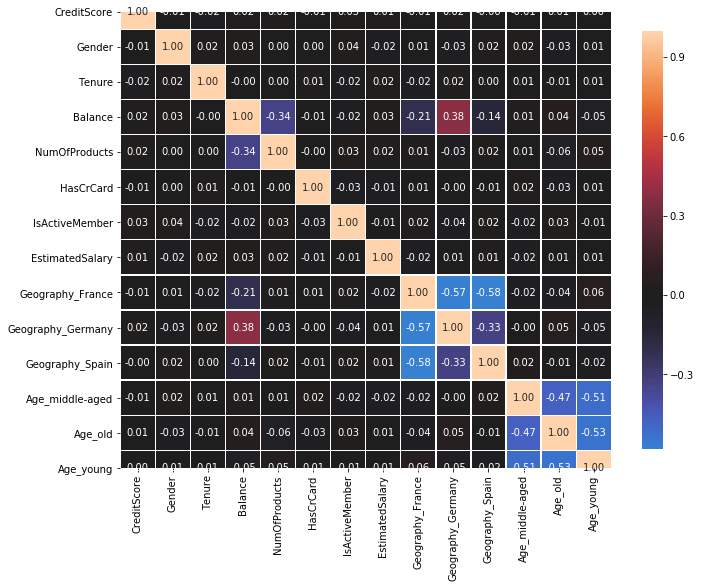

In [82]:
import matplotlib.pyplot as plt

def correlation_heatmap(dataset):
    correlations = dataset.corr(method='spearman')

    fig, ax = plt.subplots(figsize=(11,11))
    sns.heatmap(correlations, vmax=1, center=0, fmt='.2f',
                square=True, linewidths=.3, annot=True,cbar_kws={"shrink": .70})
    plt.show();
    
correlation_heatmap(df_clean)

Ideally, the dataset being used for modelling should not have significant correlations amongst descriptive features. A violation of which, would lead to us modelling multicollinear variables (Badr, 2019). 

# Data Modelling

Given that we have a binary classification task to carry out, the classifiers we shall utilise are the K-Nearest Neighbours classifier, the Decision Tree Classifer and the Random Forest Classifier. For each type of classifier; appropriate parameters and feature selection methods are used with the help of a grid search initialised through Pipelines.

For the modelling procedure; we first import the necessary packages, followed by which we specify our train-test-split in addition to the target feature array and descriptive features array. We then proceed with specifying a K-Fold Cross Validation method where k=5. Hence, the algorithm, will divide the dataset into 5 random parts consisting of 700 observations each. In each fold, the algorithm will try to predict the target values of the selected 700 observations by training on the remaining 2800 observations. The K-Fold Cross Validation method will repeat itself 3 times. The 'cv_method' is essentially a specified template that can be utlisied while fitting any selected classification model, within the grid search (hence, we specify it beforehand).

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn import metrics

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif


In [84]:
Data = df_disc_descrip_onehot

df_disc_target = df_disc_target.astype('category') #specify target as category.

target = df_disc_target

D_train, D_test, t_train, t_test = train_test_split(Data, target, test_size = 0.3, 
                                                    stratify=target, shuffle=True, 
                                                    random_state=999)

In [85]:
cv_method = RepeatedStratifiedKFold(n_splits=5,
                                    n_repeats=3,
                                    random_state=999)

## K-Nearest Neighbours  (Using Pipelines)

The first classification model we shall use is the K-Nearest Neighbours Algorithm. We can carry out feature selection and hyperparameter tuning on the dataset by utilising the 'SelectKBest( )' and 'GridSearchCV( )' functions. 'Pipelines' allow us to specify various parameters over which we would like to construct our model. These parameter specifications are as follows:

* The F-Score method and the Mutual Information method are specified as the appropriate feature selection methods. 

* The model will utilise several combinations of features (3,5,7,9 or 14 features at a time), within these methods.

* The appropriate number of neighbours that determine the prediction for any given observation, can be either; 21, 31, 41, 51, 61 or 71. According to popular literature (Subramanian, 2019), a good approximation of k is given as the square root of the number of observation in the training set. Hence, a good benchmark for k in our model is approximately 60 [=√(5000*0.7)]. Furthermore, given that we have a binary classification task at hand, it is advisable for us to use an odd number of neighbours (Subramanian, 2019). This would prevent the algorithm from being unable to classify observations that are equi-distant from its neighbours.

* The appropriate value of 'p' in our distance metric can be either; 1, 2, 3 or 4.

* According to Raschka (2018), the scoring metric we should aim to optimise is the F-1 Score (macro/micro/sample/weighted) or the Receiver Operating Charecteristic (ROC-AUC score), given that we have a class imbalance problem in our target feature (i.e., the number of non-churners is almost 4 times the number of churners in our dataset). 


In [86]:
pipe_KNN = Pipeline( [ ('fselector',SelectKBest()),
                     ('knn',KNeighborsClassifier())] )

params_pipe_KNN = {'fselector__score_func':[f_classif,mutual_info_classif],
                  'fselector__k':[3,5,7,9,14],
                  'knn__n_neighbors':[21,31,41,55,61,71],
                  'knn__p':[1,2,3,4]}

gs_pipe_KNN = GridSearchCV(estimator=pipe_KNN,
                          param_grid = params_pipe_KNN,
                          cv=cv_method,
                          verbose=1,
                          scoring='f1_weighted')

gs_pipe_KNN.fit(D_train,t_train);

Fitting 15 folds for each of 240 candidates, totalling 3600 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 3600 out of 3600 | elapsed: 11.9min finished


In [87]:
gs_pipe_KNN.best_estimator_

Pipeline(memory=None,
         steps=[('fselector',
                 SelectKBest(k=5,
                             score_func=<function mutual_info_classif at 0x1a26ed0200>)),
                ('knn',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_params=None,
                                      n_jobs=None, n_neighbors=61, p=4,
                                      weights='uniform'))],
         verbose=False)

Hence, from 240 tentative models that the algorithm has created within the grid search, the model that yields an optimal F1 Weighted Score, has the following parameter specifications:

* 5 descriptive features are being used to predict the target feature. (mutual information feature selection)
* The optimal value for the number of neighbors is 21
* The selected distance metric is the Minkowski distance metric where p=3.

In [88]:
gs_pipe_KNN.best_score_

0.8050133873922543

Hence, the best score in our model is 81.1556%. Now that our model has been trained, we can utilise it to make predictions on the testing data. In particular we can predict the target variable (t_test), by allowing the algorithm to examine the descriptive features of our testing dataset (D_test). 

We then find the various scoring metrics in order to evaluate the accuracy of our predictions:

In [89]:
knn_model=gs_pipe_KNN.best_estimator_

t_pred = knn_model.predict(D_test)

print('the roc auc score is:',metrics.roc_auc_score(t_test, t_pred))
print('the confusion matrix is:',metrics.confusion_matrix(t_test,t_pred))
print('the accuracy score is:',metrics.accuracy_score(t_test,t_pred))
print('the classification report is: ')
print(metrics.classification_report(t_test, t_pred))
print('the F-1 score is:',metrics.f1_score(t_test,t_pred))

the roc auc score is: 0.63444066068346
the confusion matrix is: [[1135   64]
 [ 204   97]]
the accuracy score is: 0.8213333333333334
the classification report is: 
              precision    recall  f1-score   support

           0       0.85      0.95      0.89      1199
           1       0.60      0.32      0.42       301

    accuracy                           0.82      1500
   macro avg       0.73      0.63      0.66      1500
weighted avg       0.80      0.82      0.80      1500

the F-1 score is: 0.41991341991341996


In accordance with the confusion matrix, the selected model misclassifies both; a non-churner as a churner 153 times and, a churner as a non churner 110 times. Meanwhile, the model correctly classifies both; churners 1,089 times and non-churners 148 times. It can be safely assumed that the cost associated with misclassifying a non-churner as a churner is lower than the cost associated with missclassifying a churner as a non-churner. However, the bank would have to determine the loss associated with a single customer churning in order to create an individual profit and loss matrix. Based on which, the total profit and loss matrix can be found by multiplying the individual profit and loss matrix into the confusion matrix. If the overall loss associated with False Positives (153 customers) is higher than the overall loss associated with False Negatives (110 customers), then the bank may incur several losses because of these misclassifications. If the opposite is true, the bank would not be as concerned with the False Positives as they are with the False Negatives. In which case, the model has performed comparitively better, but still not well.

The accuracy of the model is 82.4667%, a result we hope to improve in models to come.

The classification report indicates an ideal precision and recall for non-churners but the same cannot be said for churners. 

The ROC-AUC metric (0.70) and the F1-Score for our model (0.5295) is not ideal, given that we are more concerned with ROC-AUC scores for imbalanced target features. 

## Decision Tree Classifier (Using Pipelines)

The next classification model we shall use is the Decision Tree Classifier. The Pipeline technique allows us to specify the feature selection and hyperparameter tuning functions as we had in the K-nearest Neighbours method. The parameters over which we would like to construct our model are as follows:

* The F-Score method and the Mutual Information method are specified as the appropriate feature selection methods, again. 

* The model will try to utlise several combinations of features (3,5,7,9 or 14 features at a time), within these methods.

* The appropriate depth of the tree ('max_depth), is specified as either; 4, 5, 6, 7, 8, 9, 10 and 11. According to Mithrakumar, (2019), max_depth should not be overestimated nor underestimated as this may lead to overfitting or underfitting, respectively. Hence, we choose several possible values over which the algorithm may be able avoid this.

* The criterion for splitting is specified as either 'gini' or 'entropy'.

* For the same reasons stated in the K-Nearest Neighbours parameter specifications, we shall choose to optimise the F-1 Score or the ROC-AUC Score in our grid search.

In [90]:
pipe_DTC = Pipeline( [ ('fselector',SelectKBest()),
                     ('dtc',DecisionTreeClassifier())] )

params_pipe_DTC = {'fselector__score_func':[f_classif,mutual_info_classif],
                  'fselector__k':[3,5,7,9,14],
                  'dtc__max_depth':[4,5,6,7,8,9,10,11],
                  'dtc__criterion':['entropy','gini']}

gs_pipe_DTC = GridSearchCV(estimator=pipe_DTC,
                          param_grid = params_pipe_DTC,
                          cv=cv_method,
                          verbose=1,
                          scoring='f1_weighted')

gs_pipe_DTC.fit(D_train,t_train);

Fitting 15 folds for each of 160 candidates, totalling 2400 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


KeyboardInterrupt: 

In [ ]:
gs_pipe_DTC.best_estimator_

Hence, from 160 tentative models that the algorithm has created within the grid search, the model that yields the highest F1 Weighted score, has the following parameter specifications:

* 9 descriptive features are being used to predict the target feature (using mutual information for feature selection)
* The optimal value for max_depth is 4
* The appropriate criterion for splitting was found to be 'gini'
* min_samples_split =2
* min_sample_leaf =1

In [ ]:
gs_pipe_DTC.best_score_

Hence, the best score in our model is 83.4028%. Now that our model has been trained, we can utilise it to make predictions on the testing data. In particular we can predict the target variable (t_test), by allowing the algorithm to examine the descriptive features of our testing dataset (D_test). 

We then find the various scoring metrics in order to evaluate the accuracy of our predictions:

In [ ]:
dtc_model=gs_pipe_DTC.best_estimator_

t_pred = dtc_model.predict(D_test)

print('the roc auc score is:',metrics.roc_auc_score(t_test, t_pred))
print('the confusion matrix is:',metrics.confusion_matrix(t_test,t_pred))
print('the accuracy score is:',metrics.accuracy_score(t_test,t_pred))
print('the classification report is: ')
print(metrics.classification_report(t_test, t_pred))
print('the F-1 score is:',metrics.f1_score(t_test,t_pred))

In accordance with the confusion matrix, the selected model misclassifies both; a non-churner as a churner 173 times and, a churner as a non churner 60 times. Meanwhile, it correctly classifies both; churners 1,139 times and non-churners 128 times. If the overall loss associated with False Positives (173 customers) is higher than the overall loss associated with False Negatives (60 customers), then the bank may incur several losses because of these misclassifications. If the opposite is true, the bank would not be as concerned with the False Positives as they are with the False Negatives. In which case, the model has performed decently well, given that it only misclassifies churners 60 times (compared to 110 in KNN, earlier).

The accuracy of the model is 84.4667%, a result we hope to improve in models to come.

The classification report indicates an ideal precision and recall for non-churners but the opposite is true for churners. 

The ROC-AUC metric (0.6876) and the F1-Score (0.5235) for our model is very low. This isnt ideal, given that we are more concerned with ROC-AUC scores for imbalance target features. 

## Random Forest Classifier (Using Pipelines)

The next classification model we shall use is the Random Forest Classifier. The Pipeline technique allows us to specify the feature selection and hyperparameter tuning functions as we had in the earlier two models. The parameters over which we would like to construct our model are as follows:

* The F-Score method and the Mutual Information method are specified as the appropriate feature selection methods, again. 

* The model will try to utlise several combinations of features (3,5,7,9 or 14 features at a time), within these methods.

* The appropriate number of estimators (n_estimators), according to Jan (2013), shouldn't be overestimated in order to prevent overfitting and limit excess strain on computational power. Although the model accuracy may increase by increasing the number of trees being constructed, the cost associated with computation time and overfitting may far outweigh the benefits. Hence, the random forest model will construct 100, 150, 200 or 250 trees at a time, within our grid search.

* For the same reasons stated in the K-Nearest Neighbours parameter specifications, we shall choose to optimise the F-1 Score or the ROC-AUC Score in our grid search.

In [ ]:
pipe_RFC = Pipeline( [ ('fselector',SelectKBest()),
                     ('rfc',RandomForestClassifier())] )

params_pipe_RFC = {'fselector__score_func':[f_classif,mutual_info_classif],
                  'fselector__k':[3,5,7,9,14],
                  'rfc__n_estimators':[100,150,200,250]}

gs_pipe_RFC = GridSearchCV(estimator=pipe_RFC,
                          param_grid = params_pipe_RFC,
                          cv=cv_method,
                          verbose=1,
                          scoring='f1_weighted')

gs_pipe_RFC.fit(D_train,t_train);

In [ ]:
gs_pipe_RFC.best_estimator_

Hence, from 40 tentative models that the algorithm has created within the grid search, the model that yields the highest F1 Weighted, has the following parameter specifications:

* the forest consists of 150 decision trees
* the min_sample_split is specified as 2
* the criterion for splitting is specified as 'gini'
* the min_samples_leaf is specified as 1

In [ ]:
gs_pipe_RFC.best_score_

Hence, the best score in our model is 83.0510%. Now that our model has been trained, we can utilise it to make predictions on the testing data. In particular we can predict the target variable (t_test), by allowing the algorithm to examine the descriptive features of our testing dataset (D_test).

We then find the various scoring metrics in order to evaluate the accuracy of our predictions:

In [ ]:
rfc_model=gs_pipe_RFC.best_estimator_

t_pred = rfc_model.predict(D_test)

print('the roc auc score is:',metrics.roc_auc_score(t_test, t_pred))
print('the confusion matrix is:',metrics.confusion_matrix(t_test,t_pred))
print('the accuracy score is:',metrics.accuracy_score(t_test,t_pred))
print('the classification report is: ')
print(metrics.classification_report(t_test, t_pred))
print('the F-1 score is:',metrics.f1_score(t_test,t_pred))

In accordance with the confusion matrix, the selected model misclassifies both; a non-churner as a churner 183 times and, a churner as a non churner 51 times. Meanwhile, it correctly classifies both; churners 1,148 times and non-churners 118 times. If the overall loss associated with False Positives (183 customers) is higher than the overall loss associated with False Negatives (51), then the bank may incur several losses because of these misclassifications. If the opposite is true, the bank would not be as concerned with the False Positives as they are with the False Negatives. In which case, the model has performed decently well, given that it only misclassifies churners 51 times (in comparison to the earlier classifier methods).

The accuracy of the model is 84.4%.

The classification report indicates an ideal precision and recall for non-churners but the opposite is true for churners. 

The ROC-AUC metric (0.6747) and the F1-Score (0.5021) for our model is very low. This isnt ideal, given that we are more concerned with ROC-AUC scores for imbalance target features. 

# Conclusion

Prior to comparing the results of the selected models, we shall conduct K-Fold Cross Validation on the entire dataset using the selected models. The average of the scores for each fold (over 3 repeats) can then be compared for the two models using a paired sample T-test. 

In [ ]:
from sklearn.model_selection import cross_val_score
from scipy import stats

cv_results_KNN = cross_val_score(estimator=gs_pipe_KNN.best_estimator_,
                                 X=Data,
                                 y=target, 
                                 cv=cv_method, 
                                 n_jobs=-2,
                                 scoring='f1_weighted')
print('CV results for KNN:',cv_results_KNN.mean().round(3))

cv_results_DTC = cross_val_score(estimator=gs_pipe_DTC.best_estimator_,
                                 X=Data,
                                 y=target, 
                                 cv=cv_method, 
                                 n_jobs=-2,
                                 scoring='f1_weighted')
print('CV results for DTC:',cv_results_DTC.mean().round(3))

cv_results_RFC = cross_val_score(estimator=gs_pipe_RFC.best_estimator_,
                                X=Data,
                                y=target, 
                                cv=cv_method, 
                                n_jobs=-2,
                                scoring='f1_weighted')
print('CV results for RFC: ',cv_results_RFC.mean().round(3))

print('The p-value for the paired sample (KNN and DTC) ttest is:',
      stats.ttest_rel(cv_results_KNN, cv_results_DTC).pvalue.round(3))
print('The p-value for the paired sample (DTC and RFC) ttest is:',
      stats.ttest_rel(cv_results_DTC, cv_results_RFC).pvalue.round(3))
print('The p-value for the paired sample (KNN and RFC)ttest is:',
      stats.ttest_rel(cv_results_KNN, cv_results_RFC).pvalue.round(3))

According to the validation technique, Decision Tree Classifier yields a higher average accuracy than K-Nearest Neighbours Classifier and the Random Forest Classifer. However, the results of the ttest for DTC and RFC indicate that the difference between their results are not statistically significant at the 5% level of significance. Whereas, the results of the ttest for KNN and either of the other two models, indicate that the difference between their results are statistically significant at the 5% level of significance, given that the p-value exceeds 0.05. 

The results of the modelling procedure, indicate that the optimal models are the Decision Tree Classifer  and the Random Forest Classifier. Despite yielding different metrics, the difference between accuracies of the two classifier models, are not statistically significant at the 5% level of significance.

The performance metrics of our optimal models are less than ideal. However, this is perhaps because of the choice of features being utilised in the dataset. A better approach would be to acquire a dataset with features that are considered to be more influential when it comes to making customers churn. For instance, a survey of millenials (Jeffry, 2014), suggested that the key factors that cause millenials to switch banks is the availability of; ATMs, online services and digital banking. Perhaps the bank should consider using information on these aforementioned factors in addition to the features being used already. Including better predictors as features may enable the model to better predict churn rates.

# Summary 

The purpose of this analysis was the creation of an accurate classification model that predicts churners and non-churners within the customer base of a bank. The analysis had utilised the 'churn-modelling.csv' dataset available on Kaggle. 

The dataset had been prepared for analysis by utilising data preparation techniques provided by Varul, A (2019). Given that the dataset had been acquired from an online source, there had been barely any need for data preparation. Nonetheless, in order to ensure a proper Machine Learning work flow had been followed, the data was examined for potential errors. Followed by which, we had proceeded to visualise the various features available within the dataset. The visualisations provided indicate several factors that should be taken into consideration; (1) total bank balances of female churners had exceeded that of male churners, (2) total bank balances of churners had been highest amongst German customers, (3) there had been a high proportion of churners amongst customers who had used one product as opposed to more, (4) there had been a high proportion of churners amongst customers who had not actively engaged with the banks services. 

We had then proceeded with modelling the dataset using the K-Nearest Neighbour Classifier, Decison Tree Classifier and the Random Forest Classifier. The sample had been split into a training and testing sample (70% train, 30% test). For each classifer, a template had been constructed for a Grid Search to find the optimal number of features and hyperparameters. The training data was then fit using this template. Out of all tentative models, the two model with the best results were found to be the Decision Tree Classifier and the Random Forest Classifier. The optimal models for each of these classifers had yielded similar results that had been compared using a paired sample ttest. The results of which had indicated that the difference in __ between the models is statistically significant at the 5% level of significance. 

# References

[1] Adam, Z. (2017). Banks lead the way on customer churn. My business. https://www.mybusiness.com.au/sales/3423-banks-lead-the-way-on-customer-churn

[2] dk14. (2017). When should I balance classes in a training data set?. stats.stackexchange.com. https://stats.stackexchange.com/questions/227088/when-should-i-balance-classes-in-a-training-data-set

[3] Varul, A. (2019).  Feature Selection and Ranking in Machine Learning. www.featureranking.com

[4] Albarji. (2017). What is the rationale for discretization of continuous features and when should it be done?. https://datascience.stackexchange.com/questions/19782/what-is-the-rationale-for-discretization-of-continuous-features-and-when-should

[4] ck12. (2016). Interpreting histograms. https://www.ck12.org/statistics/histograms/lesson/Interpreting-Histograms-PST/

[5] Jeffry, P. (2014). Insights for lasting banking relationships with millennials. The  Financial Brand. https://thefinancialbrand.com/41538/millennial-gen-y-banking-research/

[6] Abdulvahed, K.D. (2013). Re: Which correlation coefficient is better to use: Spearman or Pearson? https://www.researchgate.net/post/Which_correlation_coefficient_is_better_to_use_Spearman_or_Pearson/5214b567d039b14b04fe485e/citation/download.

[7] Will, B. (2019). Why Feature Correlation Matters….A Lot!. Towards Data Science. https://towardsdatascience.com/why-feature-correlation-matters-a-lot-847e8ba439c4

[8] Dhilip, S. (2019). A simple introduction to K-Nearest Neighbours algorithm. Towards Data Science. https://towardsdatascience.com/a-simple-introduction-to-k-nearest-neighbors-algorithm-b3519ed98e

[9] Sebastien, R. Machine Learning FAQ: How can the F1-Score help with dealing with class imbalance?. Sebastianraschka.com. https://sebastianraschka.com/faq/docs/computing-the-f1-score.html

[10] Mukesh, M. (2019). How to tune a decision tree?. Towards Data Science. https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680

[11] N_estimators: Ramon, Jan. (2013). Re: How to determine the number of trees to be generated in Random Forest algorithm? https://www.researchgate.net/post/How_to_determine_the_number_of_trees_to_be_generated_in_Random_Forest_algorithm/52b6a9eed4c118a6208b4855/citation/download
